# Latihan Membangun Sistem Rekomendasi

Lantas bagaimana jaringan saraf dapat dipakai dalam sistem rekomendasi? 
Caranya, gunakan teknik yang disebut dengan “Embedding.” Embedding adalah sebuah cara untuk merepresentasikan sebuah entitas ke dalam sebuah vektor. 
Sederhananya, embedding mengubah sebuah objek ke dalam kumpulan angka kontinu. 

> “Knowledge without practice is useless. Practice without knowledge is dangerous.” — Confucius

## Data Loading

In [1]:
import numpy as np
print(np.__version__)


2.2.4


In [2]:
import numpy as np
import pandas as pd
import collections
from mpl_toolkits.mplot3d import Axes3D
from IPython import display
from matplotlib import pyplot as plt
import sklearn
import sklearn.manifold
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
tf.logging.set_verbosity(tf.logging.ERROR)
import altair as alt

2025-03-25 09:54:14.857385: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-25 09:54:14.869134: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-25 09:54:14.952260: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742871255.015827   14039 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742871255.032960   14039 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1742871255.096620   14039 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

Instructions for updating:
non-resource variables are not supported in the long term


In [5]:
print(alt.renderers.names())

['browser', 'colab', 'default', 'html', 'json', 'jupyter', 'jupyterlab', 'kaggle', 'mimetype', 'nteract', 'olli', 'png', 'svg', 'zeppelin']


In [34]:
alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('default')

RendererRegistry.enable('default')

1. **alt.data_transformers.enable('default', max_rows=None):** baris ini mengatur transformer data Altair untuk digunakan dalam notebook. Transformer data ini mengubah data mentah menjadi format yang dapat digunakan oleh Altair untuk membuat visualisasi. Dalam baris ini, kita mengatur transformer data menjadi 'default', biasanya parameter ini dapat mengubah data menjadi format yang cocok untuk visualisasi. Pengaturan max_rows=None berperan untuk menghilangkan batasan baris data yang dapat diplot. Ini bermanfaat jika kita memiliki dataset besar yang ingin kita visualisasikan sepenuhnya.
2. **alt.renderers.enable('colab'):** baris ini mengatur Altair agar dapat digunakan dalam Google Colab. Renderer adalah komponen yang bertanggung jawab untuk menampilkan visualisasi di lingkungan tempat kita bekerja, seperti browser atau notebook. Dalam baris ini, kita mengatur renderer menjadi 'colab' yang cocok untuk penggunaan Altair di Google Colab. Dengan mengatur renderer ini, visualisasi yang kita buat dengan Altair akan ditampilkan secara langsung di Google Colab.

In [7]:
print("Downloading movielens data...")
from urllib.request import urlretrieve
import zipfile
    
urlretrieve("http://files.grouplens.org/datasets/movielens/ml-100k.zip", "movielens.zip")
zip_ref = zipfile.ZipFile('movielens.zip', "r")
zip_ref.extractall()
print("Done. Dataset contains:")
print(zip_ref.read('ml-100k/u.info'))

Done. Dataset contains:
b'943 users\n1682 items\n100000 ratings\n'


In [9]:
user_cols = ['user_id', 'age', 'sex', 'occupation', 'zip_code']
users = pd.read_csv(
    'ml-100k/u.user', sep='|', names=user_cols, encoding='latin-1'
)

rating_cols = ['user_id', 'movie_id', 'rating', 'unix_timestamp']
ratings = pd.read_csv(
    'ml-100k/u.data', sep='\t', names=rating_cols, encoding='latin-1'
)

genre_cols = [
    "genre_unknown", "Action", "Adventure", "Animation", "Children", "Comedy",
    "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror",
    "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western"
]

movies_cols = [
    'movie_id', 'title', 'release_date', "video_release_date", "imdb_url"
] + genre_cols

movies = pd.read_csv(
    'ml-100k/u.item', sep='|', names=movies_cols, encoding='latin-1')

In [10]:
users

,user_id,age,sex,occupation,zip_code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213
...,...,...,...,...,...
938,939,26,F,student,33319
939,940,32,M,administrator,02215
940,941,20,M,student,97229
941,942,48,F,librarian,78209


In [11]:
ratings

,user_id,movie_id,rating,unix_timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596
...,...,...,...,...
99995,880,476,3,880175444
99996,716,204,5,879795543
99997,276,1090,1,874795795
99998,13,225,2,882399156


In [12]:
movies

,movie_id,title,release_date,video_release_date,imdb_url,genre_unknown,Action,Adventure,Animation,Children,...,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1677,1678,Mat' i syn (1997),06-Feb-1998,NaN,http://us.imdb.com/M/title-exact?Mat%27+i+syn+...,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1678,1679,B. Monkey (1998),06-Feb-1998,NaN,http://us.imdb.com/M/title-exact?B%2E+Monkey+(...,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1679,1680,Sliding Doors (1998),01-Jan-1998,NaN,http://us.imdb.com/Title?Sliding+Doors+(1998),0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1680,1681,You So Crazy (1994),01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?You%20So%20Cr...,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
print('Jumlah data film: ', len(movies.movie_id.unique()))
print('Jumlah data pengunjung: ', len(users.user_id.unique()))
print('Jumlah data penayangan: ', len(ratings.user_id))

Jumlah data film:  1682
Jumlah data pengunjung:  943
Jumlah data penayangan:  100000


In [15]:
users["user_id"] = users["user_id"].apply(lambda x: str(x-1))
movies["movie_id"] = movies["movie_id"].apply(lambda x: str(x-1))
movies["year"] = movies['release_date'].apply(lambda x: str(x).split('-')[-1])
ratings["movie_id"] = ratings["movie_id"].apply(lambda x: str(x-1))
ratings["user_id"] = ratings["user_id"].apply(lambda x: str(x-1))
ratings["rating"] = ratings["rating"].apply(lambda x: float(x))

In [16]:
genre_occurances = movies[genre_cols].sum().to_dict()
genre_occurances

{'genre_unknown': 2,
 'Action': 251,
 'Adventure': 135,
 'Animation': 42,
 'Children': 122,
 'Comedy': 505,
 'Crime': 109,
 'Documentary': 50,
 'Drama': 725,
 'Fantasy': 22,
 'Film-Noir': 24,
 'Horror': 92,
 'Musical': 56,
 'Mystery': 61,
 'Romance': 247,
 'Sci-Fi': 101,
 'Thriller': 251,
 'War': 71,
 'Western': 27}

In [19]:
def mark_genres(movies, genres):
    def get_random_genre(gs):
        active = [genre for genre, g in zip(genres, gs) if g==1]
        if len(active) == 0:
            return 'Other'
        return np.random.choice(active)
    
    def get_all_genres(gs):
        active = [genre for genre, g in zip(genres, gs) if g==1]
        if len(active) == 0:
            return 'Other'
        return '-'.join(active)
    
    movies['genre'] = [
        get_random_genre(gs) for gs in zip(*[movies[genre] for genre in genres])
    ]

    movies['all-genres'] = [
        get_all_genres(gs) for gs in zip(*[movies[genre] for genre in genres])
    ]

mark_genres(movies, genre_cols)

In [20]:
movies[['genre', 'all-genres']]

,genre,all-genres
0,Children,Animation-Children-Comedy
1,Action,Action-Adventure-Thriller
2,Thriller,Thriller
3,Comedy,Action-Comedy-Drama
4,Drama,Crime-Drama-Thriller
...,...,...
1677,Drama,Drama
1678,Romance,Romance-Thriller
1679,Drama,Drama-Romance
1680,Comedy,Comedy


In [21]:
movielens = ratings.merge(movies, on='movie_id').merge(users, on='user_id')

In [22]:
pd.options.display.max_rows = 10
pd.options.display.float_format = '{:.3f}'.format

def mask(df, key, function):
    """Returns a filtered dataframe, by applying function to key"""
    return df[function(df[key])]

def flatten_cols(df):
    df.columns = [' '.join(col).strip() for col in df.columns.values]
    return df

pd.DataFrame.mask = mask
pd.DataFrame.flatten_cols = flatten_cols

1. Pengaturan Opsi Tampilan: bagian pertama dari kode, yaitu pd.options.display.max_rows dan pd.options.display.float_format bertujuan untuk mengatur tampilan default saat kita mencetak atau menampilkan DataFrame menggunakan library pandas. Dengan mengatur max_rows, kita membatasi jumlah baris yang akan ditampilkan secara default, sementara dengan float_format, kita mengatur format tampilan untuk nilai floating point dalam DataFrame.
2. Penambahan Fungsi-Fungsi Manipulasi DataFrame: bagian kedua dari kode mendefinisikan dua fungsi, yaitu mask dan flatten_cols, dan menambahkannya ke objek DataFrame dari library pandas. Ini memperluas fungsionalitas bawaan DataFrame dengan fungsi-fungsi baru yang dapat digunakan untuk manipulasi data, yaitu:
    - Mask: untuk memfilter DataFrame berdasarkan kriteria yang diberikan pada kolom tertentu.
    - Flatten_cols: untuk menggabungkan multi-indeks kolom pada DataFrame menjadi satu level sehingga mempermudah manipulasi dan analisis data.

## Eksplorasi Data

In [23]:
users.describe(include='all')

,user_id,age,sex,occupation,zip_code
count,943,943.000,943,943,943
unique,943,NaN,2,21,795
top,942,NaN,M,student,55414
freq,1,NaN,670,196,9
mean,NaN,34.052,NaN,NaN,NaN
...,...,...,...,...,...
min,NaN,7.000,NaN,NaN,NaN
25%,NaN,25.000,NaN,NaN,NaN
50%,NaN,31.000,NaN,NaN,NaN
75%,NaN,43.000,NaN,NaN,NaN


In [24]:
# Membuat filter untuk melakukan slicing data.
occupation_filter = alt.selection_point(fields=["occupation"])
occupation_chart = alt.Chart().mark_bar().encode(
    x="count",
    y=alt.Y("occupation:N"),
    color=alt.condition(
        occupation_filter,
        alt.Color("occupation:N", scale=alt.Scale(scheme='category20')),
        alt.value("lightgray")
    )
).properties(
    width=300,
    height=300,
    selection=occupation_filter
)

# Fungsi yang dapat membuat histogram dari data yang sudah difilter.
def filtered_hist(field, label, filter):
    base = alt.Chart().mark_bar().encode(
        x=alt.X(
            field,
            bin=alt.Bin(maxbins=10),
            title=label
        ),
        y="count()",
    ).properties(
        width=300,
    )
    return alt.layer(
        base.transform_filter(filter),
        base.encode(color=alt.value('lightgray'), opacity=alt.value(.7)),
    ).resolve_scale(y='independent')

In [32]:
merged_df = pd.merge(users, ratings, on="user_id")

# Group by occupation to compute rating count and mean rating per user
users_ratings = merged_df.groupby(["user_id", "occupation"]).agg(
    rating_count=("rating", "count"),  # Number of ratings per user
    rating_mean=("rating", "mean")  # Average rating per user
).reset_index()

print(users_ratings.head())

  user_id  occupation  rating_count  rating_mean
0       0  technician           272        3.610
1       1       other            62        3.710
2      10       other           181        3.464
3     100     student            67        2.896
4     101  programmer           216        2.616


In [45]:
occupation_filter = alt.selection_point(fields=["occupation"])
occupation_chart = alt.Chart(data=users_ratings).mark_bar().encode(
    x="count()",
    y=alt.Y("occupation:N"),
    color=alt.condition(
        occupation_filter,
        alt.Color("occupation:N", scale=alt.Scale(scheme='category20')),
        alt.value("lightgray")
    ),
).add_params(occupation_filter).properties(
    width=300,
    height=300,
    # selection=occupation_filter
)

alt.hconcat(
    filtered_hist('rating_count', '# ratings / user', occupation_filter),
    filtered_hist('rating_mean', 'mean user rating', occupation_filter),
    occupation_chart,
    data=users_ratings)

alt.HConcatChart(...)

In [29]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 943 entries, 0 to 942
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   user_id     943 non-null    object
 1   age         943 non-null    int64 
 2   sex         943 non-null    object
 3   occupation  943 non-null    object
 4   zip_code    943 non-null    object
dtypes: int64(1), object(4)
memory usage: 37.0+ KB


In [30]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   movie_id            1682 non-null   object 
 1   title               1682 non-null   object 
 2   release_date        1681 non-null   object 
 3   video_release_date  0 non-null      float64
 4   imdb_url            1679 non-null   object 
 5   genre_unknown       1682 non-null   int64  
 6   Action              1682 non-null   int64  
 7   Adventure           1682 non-null   int64  
 8   Animation           1682 non-null   int64  
 9   Children            1682 non-null   int64  
 10  Comedy              1682 non-null   int64  
 11  Crime               1682 non-null   int64  
 12  Documentary         1682 non-null   int64  
 13  Drama               1682 non-null   int64  
 14  Fantasy             1682 non-null   int64  
 15  Film-Noir           1682 non-null   int64  
 16  Horror

In [31]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   user_id         100000 non-null  object 
 1   movie_id        100000 non-null  object 
 2   rating          100000 non-null  float64
 3   unix_timestamp  100000 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 3.1+ MB


In [39]:
users_ratings

,user_id,occupation,rating_count,rating_mean
0,0,technician,272,3.610
1,1,other,62,3.710
2,10,other,181,3.464
3,100,student,67,2.896
4,101,programmer,216,2.616
...,...,...,...,...
938,95,artist,56,4.268
939,96,artist,63,4.159
940,97,executive,27,3.593
941,98,student,136,3.551


In [62]:
import altair as alt
import pandas as pd


# Filter berdasarkan occupation
occupation_filter = alt.selection_point(fields=["occupation"], bind='legend')

occupation_chart = alt.Chart(ratings).mark_bar().encode(
    x="count()",
    y=alt.Y("occupation:N", sort="-x"),
    color=alt.condition(
        occupation_filter,
        alt.Color("occupation:N", scale=alt.Scale(scheme='category20')),
        alt.value("lightgray")
    )
).add_params(occupation_filter).properties(
    width=300,
    height=300
)

def filtered_hist(column, title, selection):
    return alt.Chart(users_ratings).mark_bar().encode(
        x=alt.X(f"{column}:Q", bin=True, title=title),
        y='count()',
        color=alt.condition(selection, alt.Color('occupation:N'), alt.value('lightgray'))
    )
# .transform_filter(selection).properties(width=300, height=300)

alt.hconcat(
    filtered_hist('rating_count', '# ratings / user', occupation_filter),
    filtered_hist('rating_mean', 'mean user rating', occupation_filter),
    occupation_chart
)


alt.HConcatChart(...)

In [42]:
print(users_ratings.head())  # Cek apakah datanya ada
print(users_ratings['occupation'].unique())  # Cek apakah kategori 'occupation' valid


  user_id  occupation  rating_count  rating_mean
0       0  technician           272        3.610
1       1       other            62        3.710
2      10       other           181        3.464
3     100     student            67        2.896
4     101  programmer           216        2.616
['technician' 'other' 'student' 'programmer' 'engineer' 'retired'
 'scientist' 'educator' 'salesman' 'executive' 'healthcare'
 'administrator' 'librarian' 'writer' 'artist' 'lawyer' 'none' 'marketing'
 'doctor' 'entertainment' 'homemaker']


In [43]:
alt.Chart(users_ratings).mark_bar().encode(
    x=alt.X("rating_count:Q", bin=True),  # Perbaiki nama kolom
    y="count()",
    color="occupation:N"
).properties(width=300, height=300)


alt.Chart(...)

In [48]:
movies_ratings = movies.merge(
    ratings
    .groupby('movie_id', as_index=False)
    .agg({'rating': ['count', 'mean']})
    .flatten_cols(),
    on='movie_id')
genre_filter = alt.selection_multi(fields=['genre'])
genre_chart = alt.Chart().mark_bar().encode(
    x="count()",
    y=alt.Y('genre'),
    color=alt.condition(
        genre_filter,
        alt.Color("genre:N"),
        alt.value('lightgray'))
).properties(height=300).add_selection(genre_filter) # add selection here
# Display the number of ratings and average rating per movie.
alt.hconcat(
    filtered_hist('rating_count', '# ratings / movie', genre_filter),
    filtered_hist('rating_mean', 'mean movie rating', genre_filter),
    genre_chart,
    data=movies_ratings)

/tmp/ipykernel_14039/673647042.py:7: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use selection_point instead.
  genre_filter = alt.selection_multi(fields=['genre'])
/tmp/ipykernel_14039/673647042.py:15: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  ).properties(height=300).add_selection(genre_filter) # add selection here


alt.HConcatChart(...)

In [54]:
(movies_ratings[['title', 'rating count', 'rating mean']]
    .sort_values('rating count', ascending=True)
    .head(10))

,title,rating count,rating mean
1672,Mirage (1995),1,3.000
1681,Scream of Stone (Schrei aus Stein) (1991),1,3.000
1670,"Further Gesture, A (1996)",1,1.000
1669,Tainted (1998),1,3.000
1668,MURDER and murder (1996),1,2.000
1667,Wedding Bell Blues (1996),1,3.000
1636,Girls Town (1996),1,3.000
1635,Brothers in Trouble (1995),1,4.000
1634,Two Friends (1986),1,3.000
1633,Etz Hadomim Tafus (Under the Domin Tree) (1994),1,2.000


yang hanya dirating 1 orang muncul, jadi butuh treshold

In [52]:
(movies_ratings[['title', 'rating count', 'rating mean']]
    .mask('rating count', lambda x: x > 20)
    .sort_values('rating mean', ascending=False)
    .head(10))

,title,rating count,rating mean
407,"Close Shave, A (1995)",112,4.491
317,Schindler's List (1993),298,4.466
168,"Wrong Trousers, The (1993)",118,4.466
482,Casablanca (1942),243,4.457
113,Wallace & Gromit: The Best of Aardman Animatio...,67,4.448
63,"Shawshank Redemption, The (1994)",283,4.445
602,Rear Window (1954),209,4.388
11,"Usual Suspects, The (1995)",267,4.386
49,Star Wars (1977),583,4.358
177,12 Angry Men (1957),125,4.344


Tujuan kita adalah membuat sebuah sistem yang dapat merekomendasikan suatu film kepada pengguna. Jika dibuat rumus matematisnya, kurang lebih akan mendapatkan fungsi seperti berikut.

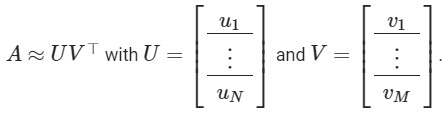

Keterangan:

- N adalah jumlah pengguna.
- M adalah jumlah film yang tersedia.
- Ui adalah urutan yang merepresentasikan pengguna.
- Vj adalah urutan yang merepresentasikan film.

## Data Splitting

In [55]:
def split_dataframe(df, holdout_fraction=0.1):
    test = df.sample(frac=holdout_fraction, replace=False)
    train = df[~df.index.isin(test.index)]
    return train, test

Tahukah kalian bahwa dataset yang kita gunakan memiliki matriks yang cukup besar? Pada ratings saja, kita memiliki 10.000 data. Nah, sebelum menggunakan fungsi split_dataframe, sebaiknya kita menggunakan fungsi tf.SparseTensor agar dapat melakukan komputasi dengan lebih efisien. Fungsi SparseTensor ini menggunakan tiga sensor untuk merepresentasikan matriks yaitu indices, values, dan dense_shape. Mari kita bahas ketiga parameter tersebut dengan lebih detail.

1. Indices
Indices adalah tensor yang berisi koordinat atau indeks dari elemen-elemen non-nol dalam tensor sparse. Bentuk tensor indices adalah [N, ndims], di mana N adalah jumlah elemen non-nol dan ndims adalah jumlah dimensi dari tensor spars.

2. Values
Values adalah tensor yang berisi nilai-nilai elemen non-nol yang sesuai dengan indeks yang diberikan dalam indices. Bentuk tensor values adalah [N], di mana N adalah jumlah elemen non-nol.

3. dense_shape
dense_shape adalah tensor yang menentukan bentuk lengkap dari tensor spars, termasuk elemen-elemen nol. Bentuk tensor dense_shape adalah [ndims], di mana ndims adalah jumlah dimensi dari tensor spars.

Agar lebih mengerti terkait materi di atas, mari asumsikan kita memiliki dua orang pengguna dan empat film. Tiga film yang sedang tayang tersebut telah mendapatkan rating seperti berikut.

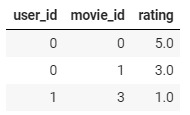

Berdasarkan DataFrame di atas, kita dapat merepresentasikannya menjadi sebuah matriks sebagai berikut.

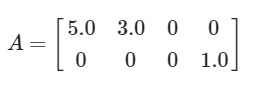

Masih ingatkah Anda jumlah data yang kita miliki? Yup, kita memiliki 1682 film dan 943 pengguna. Bayangkan berapa banyak matriks yang harus dihitung oleh komputer dengan data sebanyak itur? Tentunya akan memakan cukup banyak resource ‘kan? Nah, dengan menggunakan SparseTensor, kita akan mengubah bentuk matriks di atas menjadi lebih terstruktur sehingga komputer dapat melakukan komputasi dengan lebih efisien.

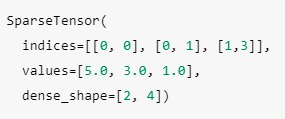

Penjelasan di atas merupakan teoritisnya saja, lalu bagaimana cara kita menerapkan materi tersebut menjadi sebuah kode? Sederhananya kita dapat membuat sebuah fungsi sesuai dengan kondisi indices dan values yang akan kita masukkan. 

In [56]:
def build_rating_sparse_tensor(ratings_df):
    indices = ratings_df[['user_id', 'movie_id']].values
    values = ratings_df['rating'].values
    return tf.SparseTensor(
        indices=indices,
        values=values,
        dense_shape=[users.shape[0], movies.shape[0]])

Kode di atas akan mengembalikan sebuah SparseTensor berdasarkan data ratings yang sudah disesuaikan dengan struktur user_id dan movie_id. Selain membuat fungsi di atas, kita juga perlu membuat sebuah fungsi yang dapat menghitung loss menggunakan pendekatan mean square error yang telah dipelajari pada modul sebelumnya.

In [58]:
def sparse_mean_square_error(sparse_ratings, user_embeddings, movie_embeddings):
  predictions = tf.gather_nd(
      tf.matmul(user_embeddings, movie_embeddings, transpose_b=True),
      sparse_ratings.indices)
  loss = tf.losses.mean_squared_error(sparse_ratings.values, predictions)
  return loss

Fungsi di atas memiliki tiga buah parameter seperti sparse_ratings, user_embeddings, dan movie_embeddings. Ketiga parameter itu memiliki fungsi yang berbeda. Lalu, apakah Anda penasaran apa isi dari parameter tersebut? Yuk, kita bahas semuanya.

1. sparse_ratings: matriks SparseTensor yang telah kita buat pada kode sebelumnya dengan bentuk larik [N, M].
2. user_embeddings: sebuah Tensor padat U dengan bentuk [N, k] di mana k adalah embedding sehingga U_i adalah embedding dari pengguna i.
3. movie_embeddings: sebuah Tensor padat V dengan bentuk [M, k] di mana k adalah dimensi penyematan dimensi embedding sehingga V_j adalah embedding dari film j.

Lalu, di dalam fungsi tersebut terdapat sintaks yang mengatur perhitungan yang dilakukan oleh tf.gather, tf.matmul, dan tf.losses. Penasaran ‘kan? Mari kita bahas keduanya bersama.

1. tf.matmul(user_embeddings, movie_embeddings, transpose_b=True): fungsi ini melakukan perkalian matriks antara embedding pengguna (user_embeddings) dan embedding film (movie_embeddings). Lalu, transpose_b=True bertugas untuk mentranspose posisi kolom dan baris dari movie_embeddings sehingga dimensi cocok untuk perkalian matriks. Hasil dari operasi ini adalah sebuah matriks di mana setiap elemen [i, j] adalah skor prediksi dari pengguna i untuk film j.
2. tf.gather_nd(..., sparse_ratings.indices): bertugas untuk mengambil elemen-elemen dari hasil perkalian matriks berdasarkan indeks yang diberikan oleh sparse_ratings.indices. Indeks ini menunjukkan posisi elemen non-nol dalam sparse_ratings yang berarti kita hanya mengambil prediksi yang relevan.
3. loss = tf.losses.mean_squared_error(sparse_ratings.values, predictions)
    - sparse_ratings.values: ini adalah nilai-nilai peringkat sebenarnya yang diberikan oleh pengguna untuk film.
    - predictions: ini adalah prediksi peringkat yang diambil dari matriks hasil perkalian embedding.
    - tf.losses.mean_squared_error(...): fungsi ini menghitung MSE antara nilai sebenarnya dan prediksi.

Secara umum, kode di atas akan mengembalikan nilai mean squared error (MSE) untuk melakukan prediksi peringkat film yang diberikan oleh pengguna berdasarkan embeddings pengguna dan film. Fungsi ini dirancang untuk melakukan komputasi berdasarkan data yang sudah diubah menjadi tensor spars sehingga dapat menghemat memori dan komputasi.

Sekarang kita akan memasuki tahapan krusial, yaitu menentukan jenis sistem rekomendasi yang akan dibangun. Seperti yang Anda tahu, pendekatan umum untuk membangun sistem rekomendasi itu terbagi menjadi dua yaitu content based filtering dan collaborative filtering. Pada kasus ini, kita akan membangun sebuah sistem rekomendasi menggunakan metode collaborative filtering model. 

Tentunya kita memerlukan sebuah library yang dapat membantu proses pembangunan model tersebut, tetapi karena Anda menyukai tantangan, mari kita lupakan sejenak dan membuat sebuah kelas yang dapat mengerjakan tugas tersebut. 

Kelas sederhana yang akan kita bangun berguna untuk melatih model faktorisasi matriks menggunakan penurunan gradien stokastik. Perhatikan kode berikut.

In [60]:
class CFModel(object):
    def __init__(self, embedding_vars, loss, metrics=None):
        self._embedding_vars = embedding_vars
        self._loss = loss
        self._metrics = metrics
        self._embeddings = {k: None for k in embedding_vars}
        self._session = None
     
    @property
    def embeddings(self):
        return self._embeddings
     
    def train(self, num_iterations=100, learning_rate=1.0, plot_results=True,
                optimizer=tf.train.GradientDescentOptimizer):
        with self._loss.graph.as_default():
          opt = optimizer(learning_rate)
          train_op = opt.minimize(self._loss)
          local_init_op = tf.group(
              tf.variables_initializer(opt.variables()),
              tf.local_variables_initializer())
          if self._session is None:
            self._session = tf.Session()
            with self._session.as_default():
              self._session.run(tf.global_variables_initializer())
              self._session.run(tf.tables_initializer())
              tf.train.start_queue_runners()
     
        with self._session.as_default():
          local_init_op.run()
          iterations = []
          metrics = self._metrics or ({},)
          metrics_vals = [collections.defaultdict(list) for _ in self._metrics]
          for i in range(num_iterations + 1):
            _, results = self._session.run((train_op, metrics))
            if (i % 10 == 0) or i == num_iterations:
              print("\r iteration %d: " % i + ", ".join(
                    ["%s=%f" % (k, v) for r in results for k, v in r.items()]),
                    end='')
              iterations.append(i)
              for metric_val, result in zip(metrics_vals, results):
                for k, v in result.items():
                  metric_val[k].append(v)
     
          for k, v in self._embedding_vars.items():
            self._embeddings[k] = v.eval()
     
          if plot_results:
            num_subplots = len(metrics)+1
            fig = plt.figure()
            fig.set_size_inches(num_subplots*10, 8)
            for i, metric_vals in enumerate(metrics_vals):
              ax = fig.add_subplot(1, num_subplots, i+1)
              for k, v in metric_vals.items():
                ax.plot(iterations, v, label=k)
              ax.set_xlim([1, num_iterations])
              ax.legend()
          return results

In [ ]:
U_var = ...
V_var = ...
loss = ...
model = CFModel(U_var, V_var, loss)
model.train(iterations=100, learning_rate=1.0)
user_embeddings = model.embeddings['user_id']
movie_embeddings = model.embeddings['movie_id']

TypeError: CFModel.train() got an unexpected keyword argument 'iterations'

In [65]:
def build_model(ratings, embedding_dim, init_stddev):
    # Membagi dataset menjadi data latih dan data uji.
    train_ratings, test_ratings = split_dataframe(ratings)
    # Mengubah dataset menjadi SparseTensor.
    A_train = build_rating_sparse_tensor(train_ratings)
    A_test = build_rating_sparse_tensor(test_ratings)
    # Inisialisasi embedding menggunakan distribusi normal.
    U = tf.Variable(tf.random_normal(
        [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
    V = tf.Variable(tf.random_normal(
        [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))
    train_loss = sparse_mean_square_error(A_train, U, V)
    test_loss = sparse_mean_square_error(A_test, U, V)
    metrics = {
        'train_error': train_loss,
        'test_error': test_loss
    }
    embeddings = {
        "user_id": U,
        "movie_id": V
    }
    return CFModel(embeddings, train_loss, [metrics])

In [66]:
model = build_model(ratings, embedding_dim=30, init_stddev=0.5)
model.train(num_iterations=1000, learning_rate=10.)

AttributeError: module 'tensorflow' has no attribute 'random_normal'

Kode di atas adalah bagian dari pipeline machine learning yang digunakan untuk membangun dan melatih model. Dalam konteks ini, kita memiliki dua bagian utama yaitu membangun model dan melatih model. Mari kita jelaskan setiap bagian dengan detail.

Baris pertama memanggil fungsi build_model untuk membangun model machine learning. Penjelasan rinci terkait argumen yang diberikan adalah sebagai berikut.

1. Ratings: data yang digunakan untuk melatih model. Data ini berbentuk matriks di mana setiap baris mewakili pengguna dan kolom mewakili item (misalnya, film), dengan nilai-nilai yang menunjukkan peringkat yang diberikan oleh pengguna kepada item.
2. embedding_dim=30: parameter ini menentukan dimensi dari embedding yang akan digunakan untuk pengguna dan item. Embedding adalah representasi vektor dari pengguna dan item dalam ruang berdimensi rendah yang membantu dalam menangkap karakteristik dan hubungan mereka. Dalam hal ini, dimensi embedding ditetapkan menjadi 30 vektor.
3. init_stddev=0.5: nilai deviasi standar untuk inisialisasi awal dari embedding. Inisialisasi dengan deviasi standar 0.5 berarti nilai-nilai awal dari embedding akan diambil dari distribusi normal dengan rata-rata 0 dan deviasi standar 0.5. Inisialisasi yang baik dapat membantu model untuk konvergen lebih cepat dan lebih stabil.

Hasil dari fungsi build_model adalah sebuah objek model yang berisi struktur dan parameter dari model yang telah dibangun berdasarkan data dan parameter yang diberikan. Selanjutnya, kita perlu melatih model menggunakan fungsi model.train(). Fungsi ini memanggil metode train pada objek model untuk melatih model. Mari kita jelaskan argumen-argumen yang diberikan.

1. num_iterations=1000: parameter ini menentukan jumlah iterasi atau langkah dalam proses pelatihan. Semakin banyak iterasi, semakin lama model akan dilatih yang umumnya meningkatkan performa model sampai titik tertentu di mana overfitting dapat terjadi.
2. learning_rate=10.: parameter Ini menentukan kecepatan pembelajaran (learning rate) yang digunakan dalam optimizers. Learning rate menentukan seberapa besar langkah yang diambil pada setiap iterasi saat memperbarui parameter model. Dalam hal ini, learning rate ditetapkan sangat besar, yaitu 10. Biasanya, learning rate yang besar dapat menyebabkan model melompat-lompat di sekitar minimum dan tidak konvergen dengan baik. Nilai learning rate biasanya disesuaikan dengan hati-hati dan sering kali lebih kecil, seperti 0.001 atau 0.01.

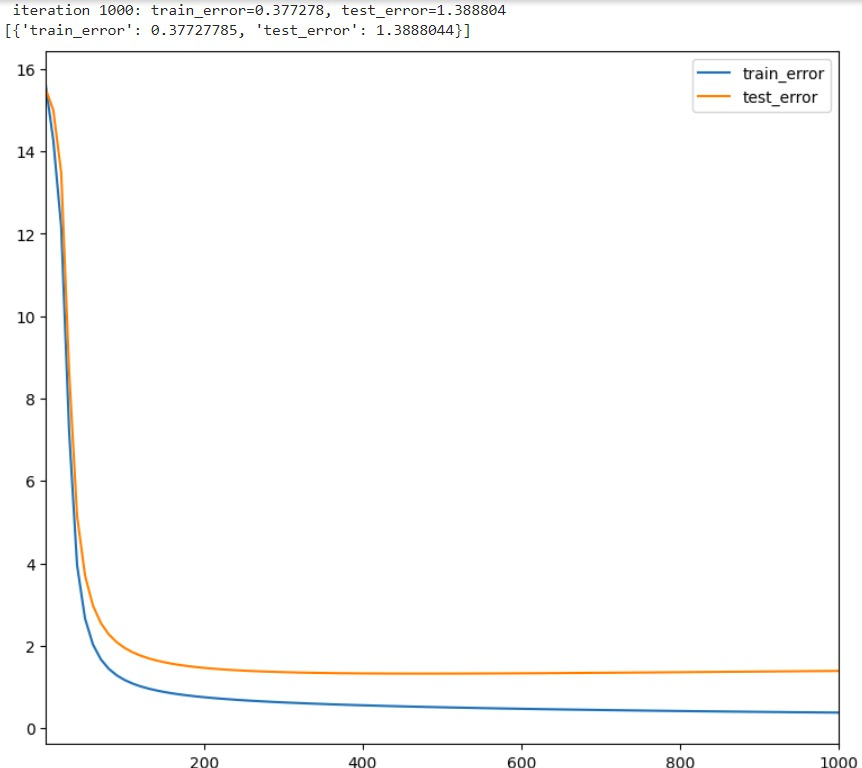

Setelah model dilatih, apakah Anda mengingat tahapan selanjutnya? Pada machine learning workflow tentunya kita harus melakukan evaluasi agar mengetahui performa model yang telah dibangun. Pada kasus sistem rekomendasi ada beberapa cara untuk menghitung kemiripan fitur yang ada salah dua contohnya adalah menggunakan dot dan cosine similarity. Dot dan cosine similarity adalah dua metode yang umum digunakan untuk mengukur kesamaan antara dua vektor. Kedua metode ini digunakan untuk menemukan item yang serupa atau pengguna yang serupa berdasarkan fitur yang ada. Berikut penjelasan detail mengenai keduanya.

- Dot similarity adalah ukuran kesamaan yang diperoleh dari perkalian titik (dot product) antara dua vektor. Ini digunakan dalam berbagai aplikasi, termasuk dalam sistem rekomendasi untuk mengukur seberapa mirip dua vektor, seperti vektor pengguna dan vektor item.
- Cosine similarity adalah ukuran kesamaan yang mengukur cosinus sudut antara dua vektor dalam ruang berdimensi. Cosine similarity mengukur orientasi sehingga memberikan indikasi yang lebih akurat tentang seberapa mirip arah dua vektor.

Dalam sistem rekomendasi, cosine similarity lebih umum digunakan dibandingkan dot similarity karena lebih efektif dalam menangani data dengan berbagai skala dan memberikan hasil yang lebih akurat tentang kesamaan fitur. Misalnya, untuk merekomendasikan film, cosine similarity dapat digunakan untuk menemukan film yang memiliki kesamaan fitur berdasarkan preferensi pengguna, meskipun jumlah rating pengguna bervariasi.

Karena kita sudah pernah membahas detail dari pendekatan kemiripan pada modul sebelumnya, sekarang saatnya kita terjun bebas menuju pembuatan kode yang dapat menghitung skor kemiripan.



In [68]:
DOT = 'dot'
COSINE = 'cosine'
def compute_scores(query_embedding, item_embeddings, measure=DOT):
    u = query_embedding
    V = item_embeddings
    if measure == COSINE:
        V = V / np.linalg.norm(V, axis=1, keepdims=True)
        u = u / np.linalg.norm(u)
    scores = u.dot(V.T)
    return scores

Fungsi di atas akan menghitung skor kesamaan antara data user dan item yang sudah melewati tahapan embedding menggunakan dua jenis ukuran kesamaan yaitu konstanta dot product dan cosine similarity. 

Sampai di sini, model yang Anda bangun belum menghasilkan rekomendasi sama sekali. Hal ini karena kita belum membangun sebuah sintaks atau fungsi yang dapat melakukan inference berdasarkan model yang sudah dibuat.

Untuk melakukan inference pada model collaborative filtering, kita bisa menggunakan dua pendekatan yaitu memberikan rekomendasi berdasarkan pengguna terdekat dan film terdekat. Mari kita bahas mulai dari pengguna terdekat.

In [70]:
def user_recommendations(model, measure=DOT, exclude_rated=True, k=6):
    if USER_RATINGS:
        scores = compute_scores(
            model.embeddings["user_id"][942], model.embeddings["movie_id"], measure)
        score_key = measure + ' score'
    df = pd.DataFrame({
        score_key: list(scores),
        'movie_id': movies['movie_id'],
        'titles': movies['title'],
        'genres': movies['all_genres'],
    })
    if exclude_rated:
        # Menghapus film yang sudah diberikan rating oleh user.
        rated_movies = ratings[ratings.user_id == "942"]["movie_id"].values
        df = df[df.movie_id.apply(lambda movie_id: movie_id not in rated_movies)]
    display.display(df.sort_values([score_key], ascending=False).head(k))

Fungsi user_recommendations di atas bertugas untuk menghasilkan rekomendasi film bagi seorang pengguna berdasarkan model embedding yang telah dilatih. Tujuannya untuk memberikan rekomendasi film untuk pengguna tertentu (dalam contoh kasus ini pengguna dengan ID 942). Berikut adalah langkah-langkah yang diambil fungsi ini.

1. Menghitung skor kesamaan antara embedding pengguna dan embedding semua film.
2. Membuat DataFrame yang berisi skor kesamaan, ID film, judul film, dan genre film.
3. Menghapus film yang sudah diberi rating oleh pengguna (jika exclude_rated adalah True).
4. Mengurutkan DataFrame berdasarkan skor kesamaan dan menampilkan sejumlah rekomendasi teratas yang ditentukan oleh parameter k.

Mari kita lihat output dari penggunaan fungsi berikut.

In [71]:
USER_RATINGS = True
user_recommendations(model, measure=COSINE, k=5)
user_recommendations(model, measure=DOT, k=5)

TypeError: 'NoneType' object is not subscriptable

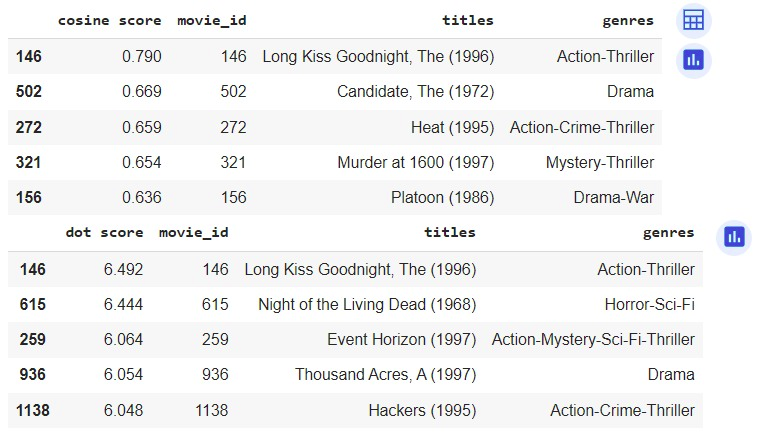

In [73]:
def movie_neighbors(model, title_substring, measure=DOT, k=6):
      # Mencari film berdasarkan judul yang dimasukkan.
      ids =  movies[movies['title'].str.contains(title_substring)].index.values
      titles = movies.iloc[ids]['title'].values
      if len(titles) == 0:
        raise ValueError("Found no movies with title %s" % title_substring)
      print("Nearest neighbors of : %s." % titles[0])
      if len(titles) > 1:
        print("[Found more than one matching movie. Other candidates: {}]".format(
            ", ".join(titles[1:])))
      movie_id = ids[0]
      scores = compute_scores(
          model.embeddings["movie_id"][movie_id], model.embeddings["movie_id"],
          measure)
      score_key = measure + ' score'
      df = pd.DataFrame({
          score_key: list(scores),
          'titles': movies['title'],
          'genres': movies['all_genres']
      })
      display.display(df.sort_values([score_key], ascending=False).head(k))

In [74]:
movie_neighbors(model, "Star Wars", DOT)
movie_neighbors(model, "Star Wars", COSINE)

Nearest neighbors of : Star Wars (1977).


TypeError: 'NoneType' object is not subscriptable

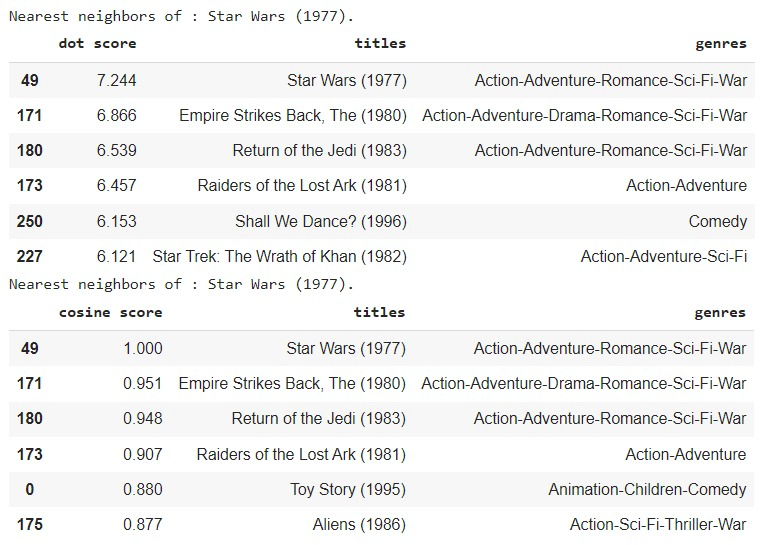